## Pedagogy

### CNN cheat sheet

#### Architecture overview

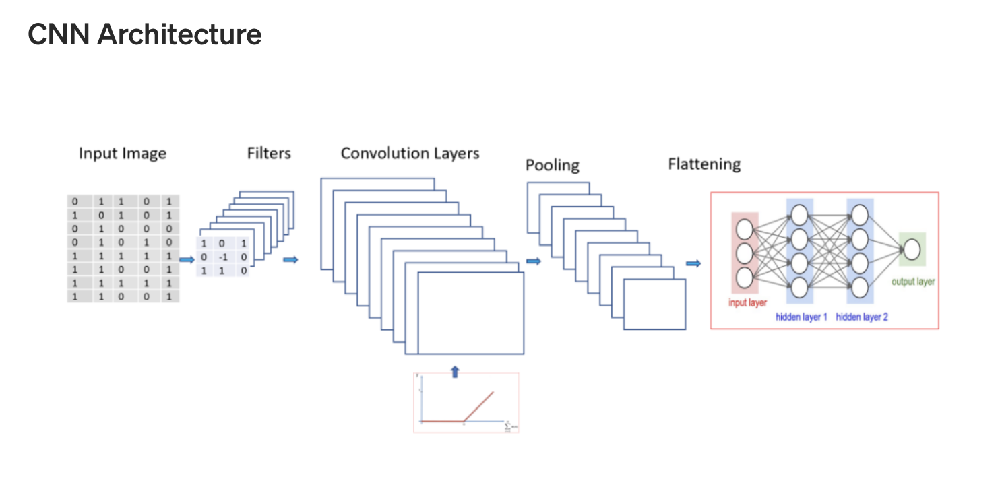

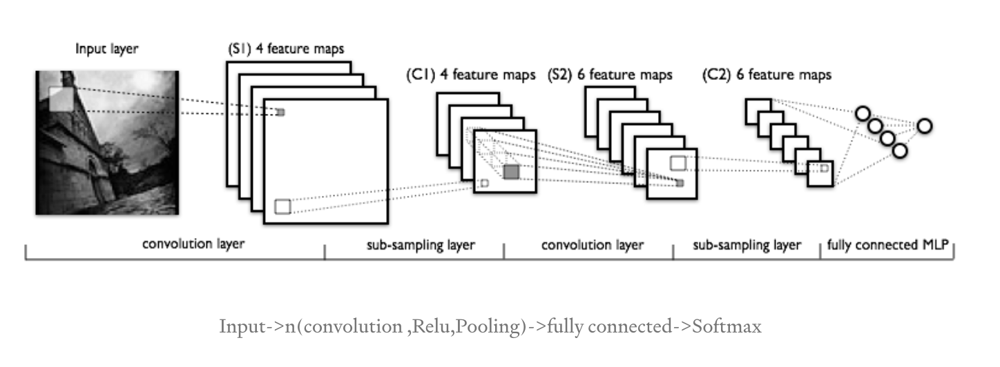

#### Glossary

- we would like to clarify a few terminologies: **layers, channels, feature maps, filters, and kernels**. From a hierarchical point of view, the concepts of layers and filters are at the same level, while channels and kernels are at one level below. Channels and feature maps are the same thing. A layer could have multiple channels (or feature maps): an input layer has 3 channels if the inputs are RGB images. “channel” is usually used to describe the structure of a “layer”. Similarly, “kernel” is used to describe the structure of a “filter”.

- **Neuron**: A node in a neural network, typically taking in multiple input values and generating one output value. The neuron calculates the output value by applying an activation function (nonlinear transformation) to a weighted sum of input values.

-  **Layer**: layer
A set of neurons in a neural network that process a set of input features, or the output of those neurons.

- **Convolution:** Mathematical operations basically(element-wise multiplication and addition), without technical details, different features are extracted through convolution using filters whose weights are automatically learned during training. All these extracted features then are ‘combined’ to make decisions. Convolution also takes spatial relationship of pixels into considerations.

- **Filter vs Kernel**  The difference between filter and kernel is a bit tricky. Sometimes, they are used interchangeably, which could create confusions. Essentially, these two terms have subtle difference. 
    - A “Kernel” refers to a 2D array of weights. 
    - The term “filter” is for 3D structures of multiple kernels stacked together. For a 2D filter, filter is same as kernel. But for a 3D filter and most convolutions in deep learning, a filter is a collection of kernels. Each kernel is unique, emphasizing different aspects of the input channel.
    - The **filters** will determine which pixels or parts of the image the model will focus on.

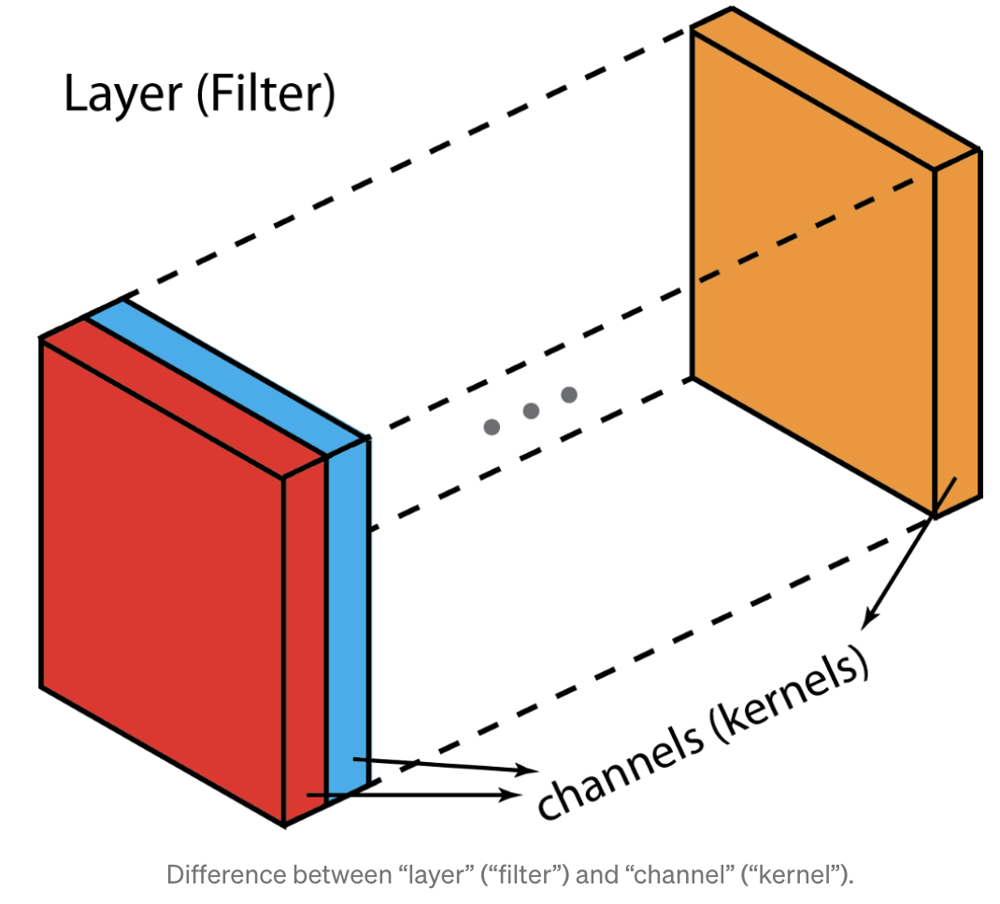

- **activation function** A function (for example, ReLU or sigmoid) that takes in the weighted sum of all of the inputs from the previous layer and then generates and passes an output value (typically nonlinear) to the next layer.

- **feature maps** capture the result of applying filters to an input image

- **Backpropagation** The primary algorithm for performing gradient descent on neural networks. First, the output values of each node are calculated (and cached) in a forward pass. Then, the partial derivative of the error with respect to each parameter is calculated in a backward pass through the graph.

### Recognize patterns

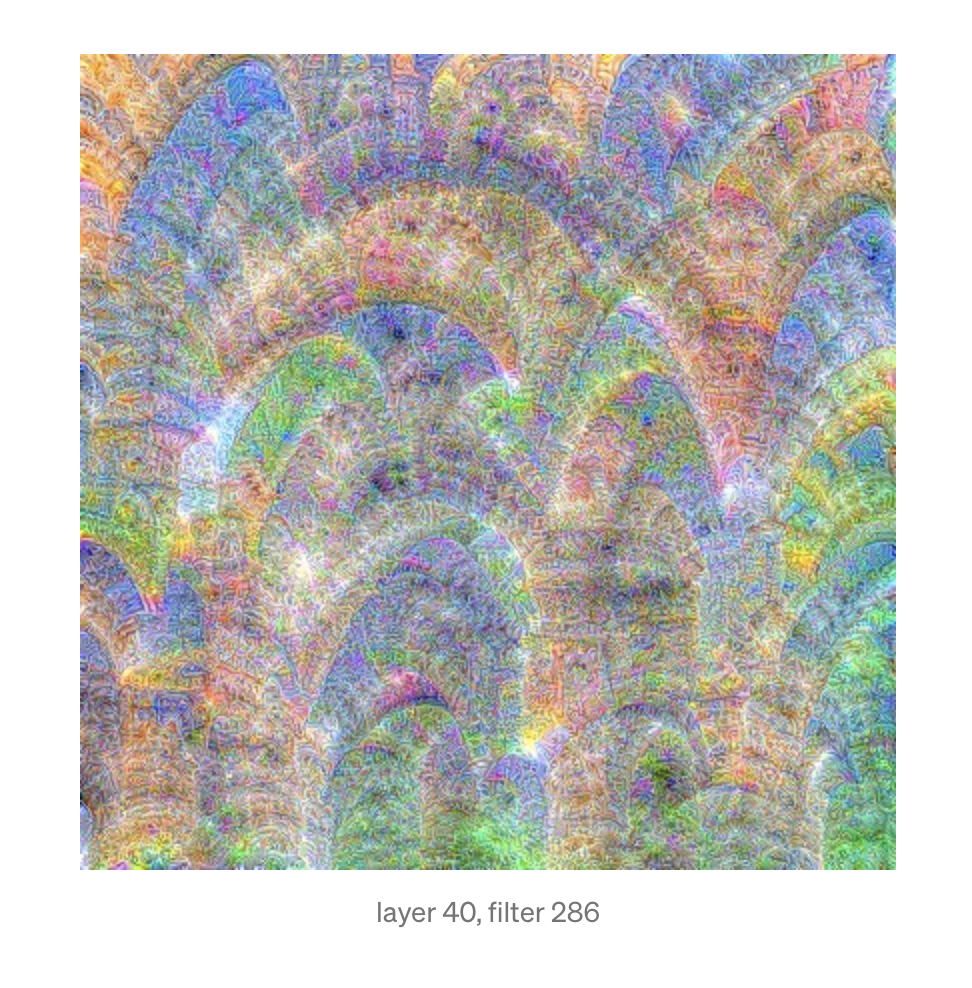

> The picture of the artificial arches above was created by maximizing the mean activation of the 286th feature map in the 40th layer of a VGG-16 network.

> Let's say we have an intuition that it looks like vaulted ceilings in a cathderal as below. and we want to test out this hypothesis

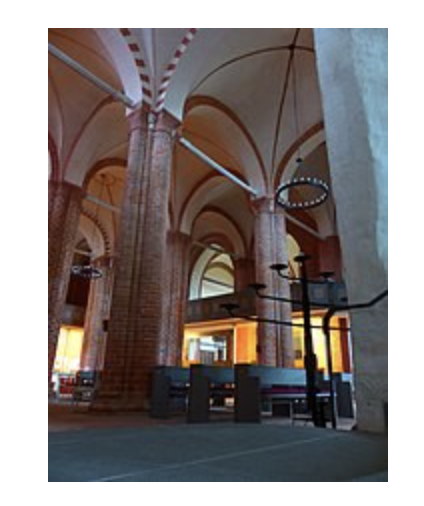

> to test this hypothesis, we can "simply" apply the network to the picture and plot the average activations of the feature maps in the 40th layer.

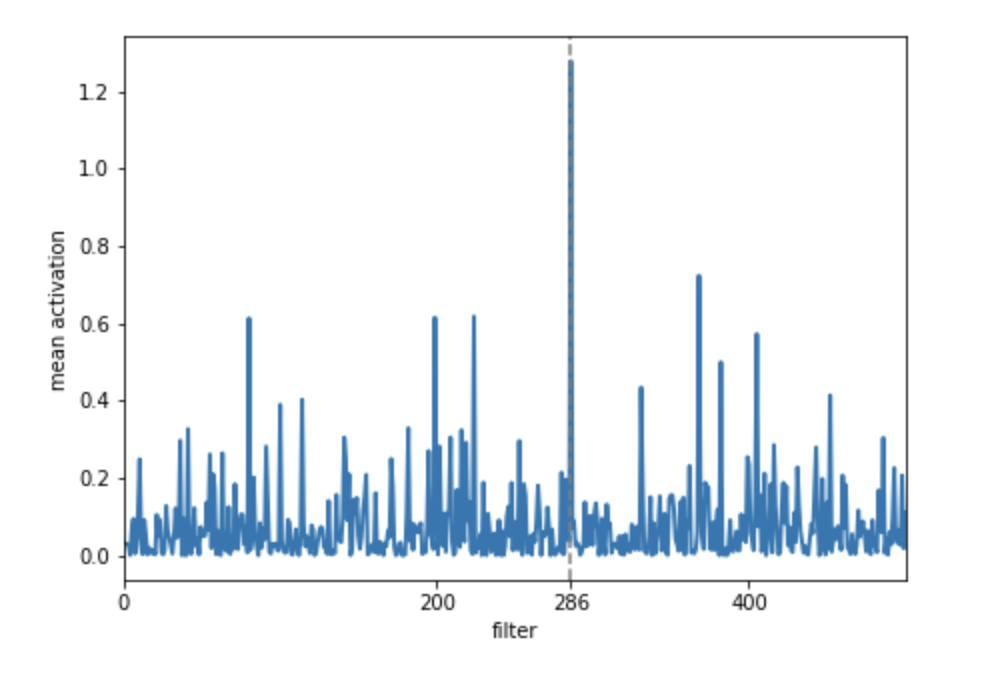

INTERPRETATION: A strong spike at feature map 286, as expected! 

So does this mean that filter 286 in layer 40 is the filter responsible for detecting vaulted ceilings?

Filter 286 apparently responds to arch like structures in images but keep in mind that such arch-like structures might play an important role for several different categories.

### Current methodology used by data scientist (by optimisation)

- The idea is the following: we start with a picture containing random pixels. 
- We apply the network in evaluation mode to this random image, calculate the average activation of a certain feature map in a certain layer from which we then compute the gradients with respect to the input image pixel values. 
- Knowing the gradients for the pixel values we then proceed to update the pixel values in a way that maximizes the average activation of the chosen feature map.

in more understandable vocabulary it can be summarized by:

- The network weights are fixed
- the network will not be trained
- we try to find an image that maximizes the average activation of a certain feature map by performing gradient descent optimization on the pixel values.

In order to implement this we will need:
- A random image to start with
- A pre-trained network in evaluation mode
- A nice way to access the resulting activations of any hidden layer we are interested in
- A loss function to compute the gradients and an optimizer to update the pixel values

## Filters and feature maps viz demo on a painting with VGG16

### import

In [1]:
from keras.applications.vgg16 import VGG16
from matplotlib import pyplot
from matplotlib.pyplot import figure
from tensorflow.keras import layers, models,Input,Model
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator,load_img, img_to_array
from tensorflow import expand_dims
from keras.applications.vgg16 import preprocess_input

### Our input painting

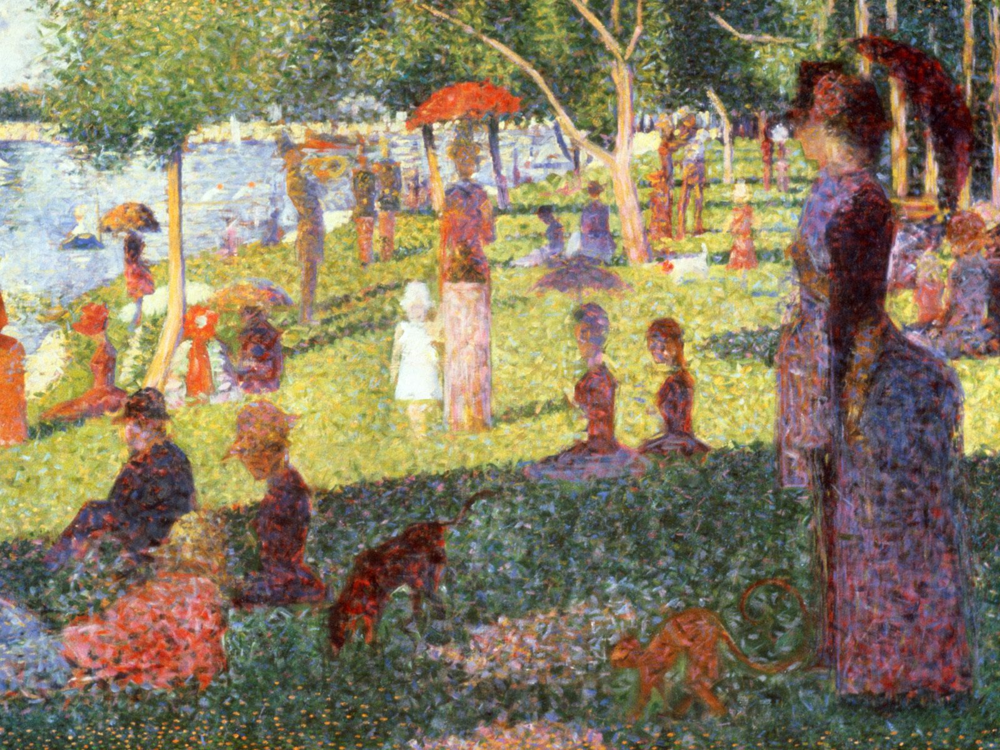

### Pre-fit VGG Model

In [2]:
!pwd

/Users/axlav/code/Aximande/Neural-Art/notebooks


In [3]:
# load vgg model
# load the model
model = VGG16()
# summarize the model
model.summary()

2021-08-30 10:57:43.339684: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

> **interpretation:** this summary gives us the output shape of each layer, e.g. the shape of the resulting feature maps + the total number of weights per layer.

In [4]:
type(model)

keras.engine.functional.Functional

### Visualize Filters of our model

> simplest visualization to perform is to plot the learned filters directly.

In [5]:
model.layers

In [6]:
# summarize filter shapes
for layer in model.layers:
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # get filter weights
    filters, biases = layer.get_weights()
    print(layer.name, filters.shape)
    
#note after each pooling layer, we move block numbers

block1_conv1 (3, 3, 3, 64)
block1_conv2 (3, 3, 64, 64)
block2_conv1 (3, 3, 64, 128)
block2_conv2 (3, 3, 128, 128)
block3_conv1 (3, 3, 128, 256)
block3_conv2 (3, 3, 256, 256)
block3_conv3 (3, 3, 256, 256)
block4_conv1 (3, 3, 256, 512)
block4_conv2 (3, 3, 512, 512)
block4_conv3 (3, 3, 512, 512)
block5_conv1 (3, 3, 512, 512)
block5_conv2 (3, 3, 512, 512)
block5_conv3 (3, 3, 512, 512)


**Interpretation:**
>  Running the example prints a list of layer details including the layer name and the shape of the filters in the layer.

> We can see that all convolutional layers use 3×3 filters, which are small and perhaps easy to interpret.

> An architectural concern with a convolutional neural network is that the depth of a filter must match the depth of the input for the filter (e.g. the number of channels).



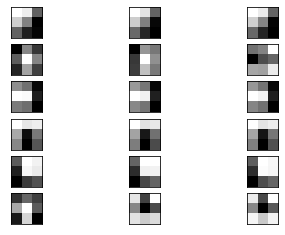

In [7]:
# retrieve weights from the n_conv hidden layer
n_layer = 1
filters, biases = model.layers[n_layer].get_weights()

# normalize filter values to 0-1 so we can visualize them
f_min, f_max = filters.min(), filters.max()
filters = (filters - f_min) / (f_max - f_min)

# plot first n_filters
n_filters, ix = 6, 1
for i in range(n_filters):
    # get the filter
    f = filters[:, :, :, i]
    # plot each channel separately
    for j in range(3):
        # specify subplot and turn of axis
        ax = pyplot.subplot(n_filters, 3, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        pyplot.imshow(f[:, :, j], cmap='gray')
        ix += 1
        
# show the figure
pyplot.show()

> **ok what is this ?** we enumerate the first six filters out of the 64 in the block 1 and plot each of the three channels (RGB) of each filter. We plot each filter (6) as a new row of subplots, and each filter channel or depth as a new column.

> **interpretation**: 
    > We can see that in some cases, the filter is the same across the channels (the first row), and in others, the filters differ (the last row). 
    > You may notice that some patches are dark and others are bright. We know that pixel values range from 0 to 255. 0 corresponds fully black color, and 255 corresponds to the white color. This means that the dark patches have a lower weight than the brighter patches. 
    > Using this intuition, we can see that the filters on the first row detect a gradient from light in the top left to dark in the bottom right. 
    > When the affine transformations take place with the input image, then the white patches will be more responsible for the activation of that part of the image. 
    > In simple words, the model will focus more on the area of the image where the weight values are more when doing the element-wise product of the weights with the pixel values.

> ! **limitations** ! Sadly, this does not scale; if we wish to start looking at filters in the second convolutional layer, we can see that again we have 64 filters, but each has 64 channels to match the input feature maps. To see all 64 channels in a row for all 64 filters would require (64×64) 4,096 subplots in which it may be challenging to see any detail.

### Visualize  feature maps from One layer of our model for our painting

In [10]:
cd pointi/

/Users/axlav/code/Aximande/Neural-Art/notebooks/pointi


In [11]:
# load the image stored in my local folder pointi (for now stored in notebooks) with the required shape when working with VGG16
img = load_img('seurat.jpg', target_size=(224, 224))

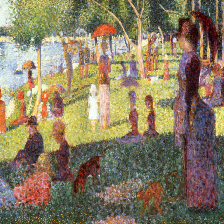

In [12]:
img

> The activation maps, called feature maps, capture the result of applying the filters to input, such as the input image or another feature map.

> **ok but why should you care ?** The idea of visualizing a feature map for a specific input image would be to understand what features of the input are detected or preserved in the feature maps. 

In [24]:
# summarize feature map size for each conv layer
from keras.applications.vgg16 import VGG16
from matplotlib import pyplot

model = VGG16()

# summarize feature map shapes
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # summarize output shape
    print(i, layer.name, layer.output.shape)

1 block1_conv1 (None, 224, 224, 64)
2 block1_conv2 (None, 224, 224, 64)
4 block2_conv1 (None, 112, 112, 128)
5 block2_conv2 (None, 112, 112, 128)
7 block3_conv1 (None, 56, 56, 256)
8 block3_conv2 (None, 56, 56, 256)
9 block3_conv3 (None, 56, 56, 256)
11 block4_conv1 (None, 28, 28, 512)
12 block4_conv2 (None, 28, 28, 512)
13 block4_conv3 (None, 28, 28, 512)
15 block5_conv1 (None, 14, 14, 512)
16 block5_conv2 (None, 14, 14, 512)
17 block5_conv3 (None, 14, 14, 512)


In [14]:
model.inputs

[<KerasTensor: shape=(None, 224, 224, 3) dtype=float32 (created by layer 'input_2')>]

In [15]:
model.layers[1].output


<KerasTensor: shape=(None, 224, 224, 64) dtype=float32 (created by layer 'block1_conv1')>

> ok this is where it starts to be complicated !! fasten you seatbelt
> We know the feature map size of each conv layers. We can use this information and design a new model that is a subset of the layers in the full VGG16 model. The model would have the same input layer as the original model, but the output would be the output of a given convolutional layer, which we know would be the activation of the layer or the feature map.

In [16]:
# redefine model to output right after the first hidden layer
n_layer = 1
model = Model(inputs=model.inputs, outputs=model.layers[1].output) #if you change the n_layer you 


In [17]:
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
Total params: 1,792
Trainable params: 1,792
Non-trainable params: 0
_________________________________________________________________


> !! point code !!
- Model() groups layers into an object with training and inference features.
- Arguments

    - inputs: The input(s) of the model: a keras.Input object or list of keras.Input objects.
    - outputs: The output(s) of the model

> **What happened in the cell above ?** after loading the VGG model, we can define a new model that outputs a feature map from the first convolutional layer (index 1)

> Making a prediction with this model will give the feature map for the first convolutional layer for a given provided input image.

In [18]:
# convert the image to an array
img = img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)


In [19]:
img.shape

TensorShape([1, 224, 224, 3])

> the image PIL object needs to be converted to a NumPy array of pixel data and expanded from a 3D array to a 4D array with the dimensions of [samples, rows, cols, channels]

In [20]:
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)


> We are now ready to get the feature map. We can do this easy by calling the model.predict() function and passing in the prepared single image.

In [21]:
feature_maps = model.predict(img)


/Users/axlav/.pyenv/versions/3.8.6/envs/neuralart_3.8.6/lib/python3.8/site-packages/pandas/compat/__init__.py:124: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)
2021-08-30 10:58:51.535061: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


> We know the result will be a feature map with 224x224x64. We can plot all 64 two-dimensional images as an 8×8 square of images.

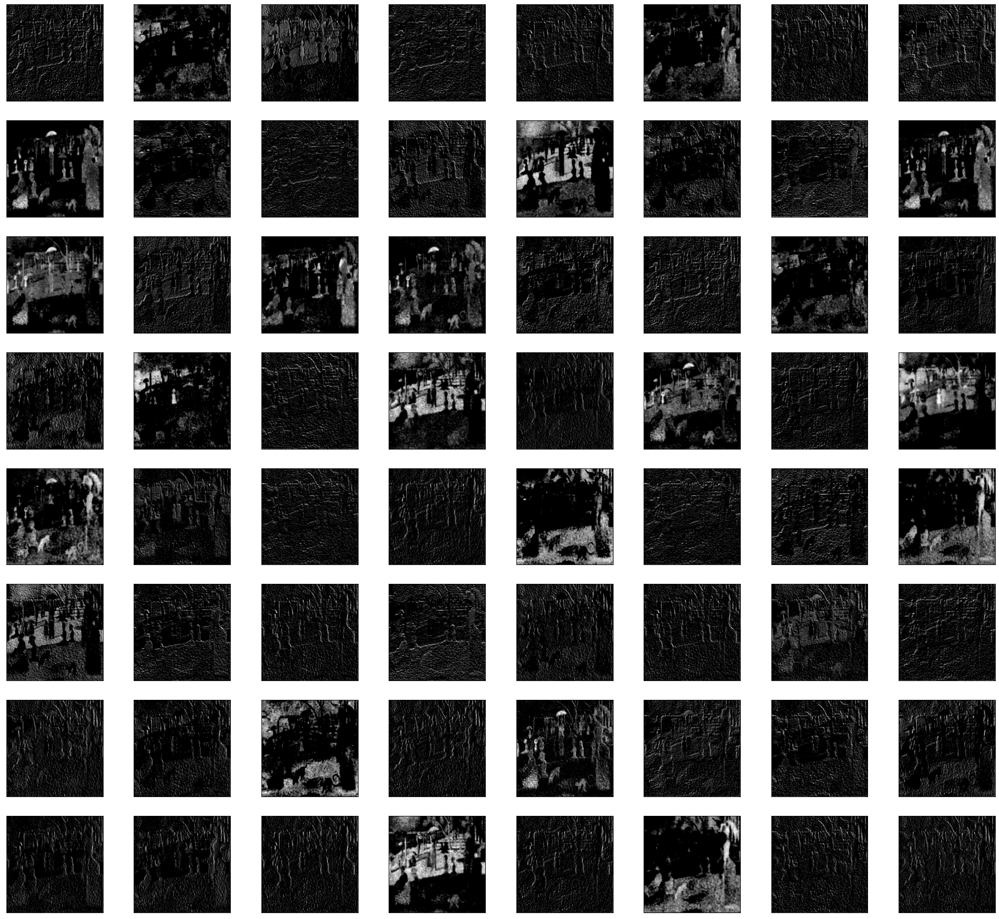

In [22]:
# plot all 64 maps in an 8x8 squares
square = 8
ix = 1
figure(figsize=(30, 28), dpi=80)
for _ in range(square):
    for _ in range(square):
        # specify subplot and turn of axis
        ax = pyplot.subplot(square, square, ix)
        ax.set_xticks([])
        ax.set_yticks([])
        # plot filter channel in grayscale
        pyplot.imshow(feature_maps[0, :, :, ix-1],cmap='')
        ix += 1
# show the figure
pyplot.show()

### Visualize  feature maps from Multiple conv layers of our model for our painting

- We could update the example to plot the feature maps from the output of other specific convolutional layers.

- Another approach would be to collect feature maps output from each block of the model in a single pass, then create an image of each.

- There are five main blocks in the image (e.g. block1, block2, etc.) that end in a pooling layer. The layer indexes of the last convolutional layer in each block are [2, 5, 9, 13, 17].

- We can define a new model that has multiple outputs, one feature map output for each of the last convolutional layer in each block; for example:

In [25]:
ixs = [2, 5, 9, 13, 17]
outputs = [model.layers[i].output for i in ixs]

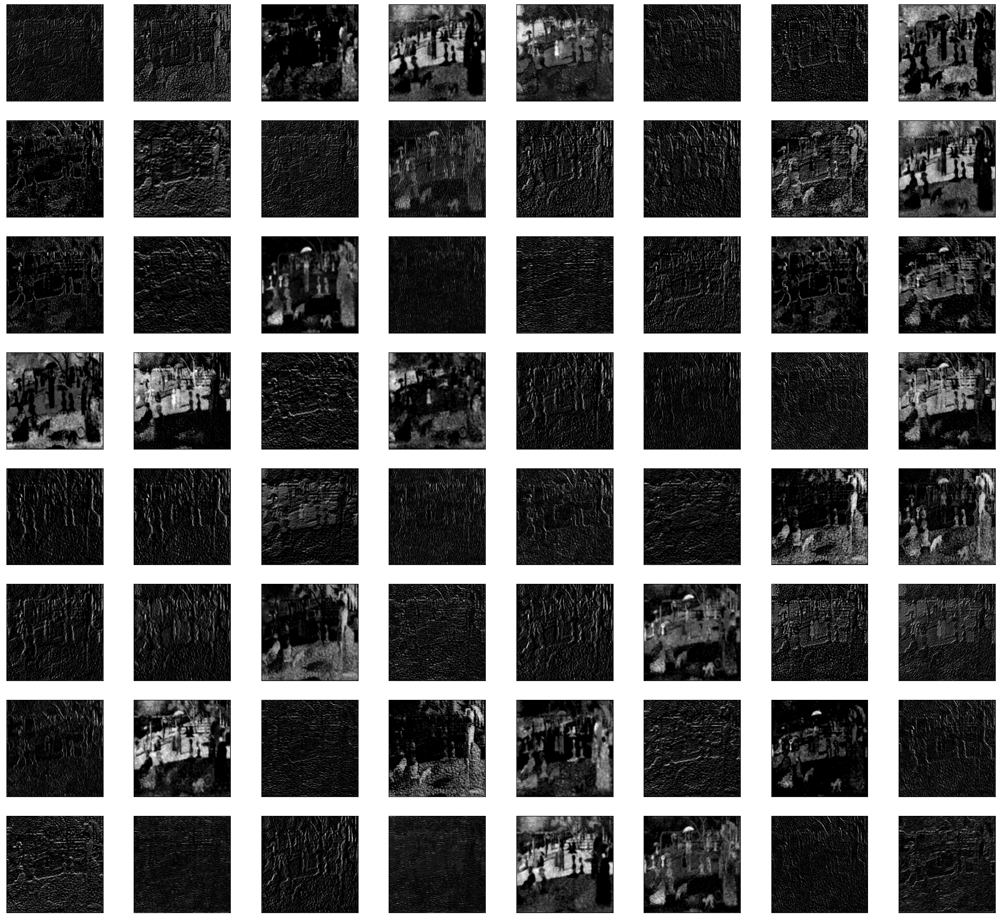

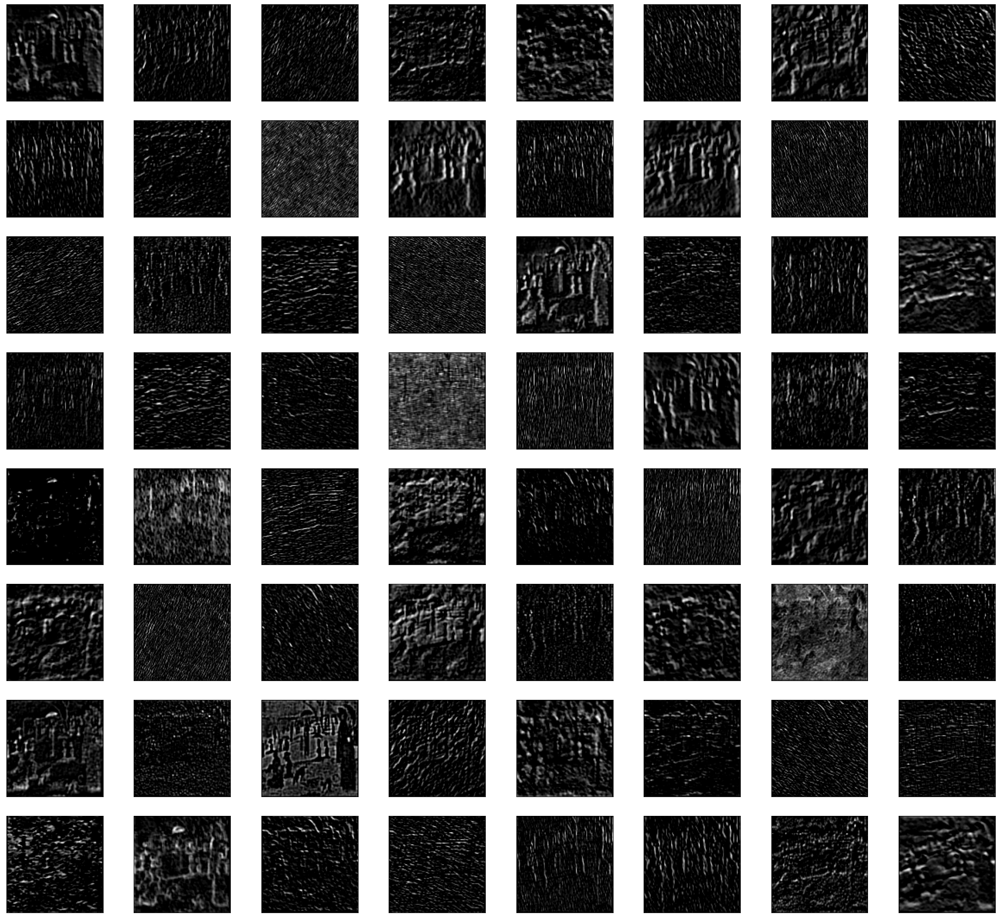

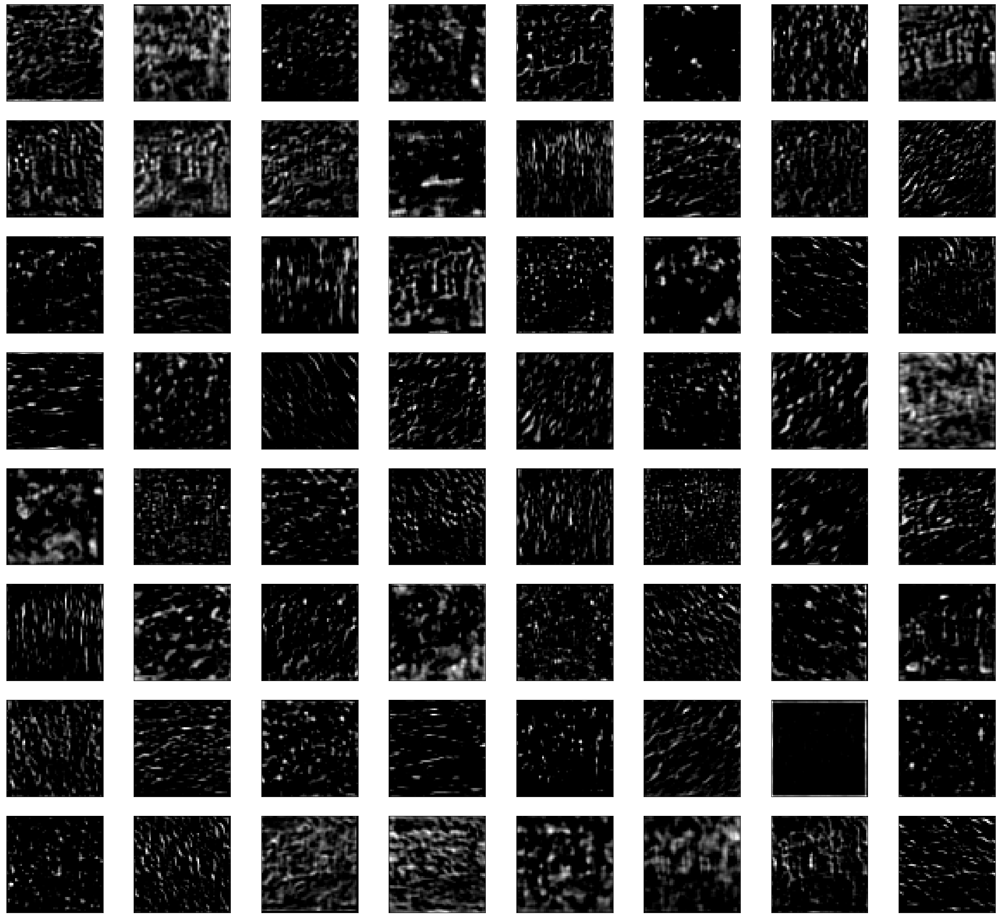

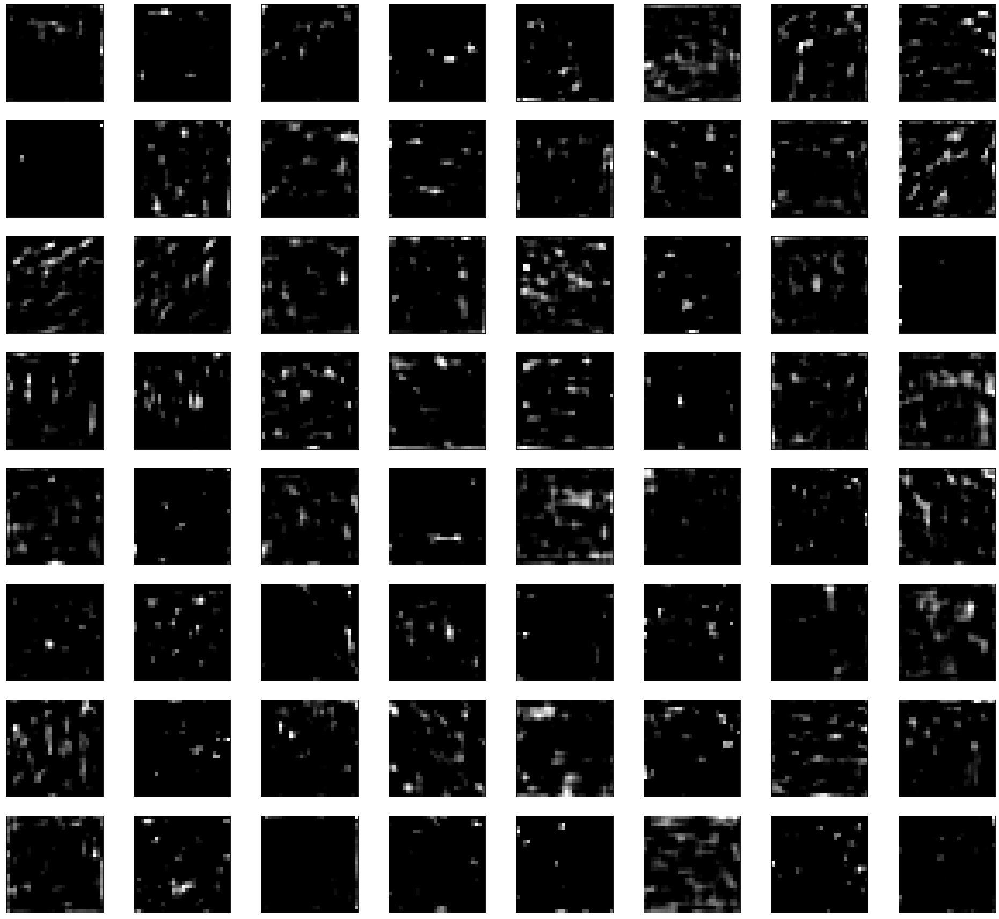

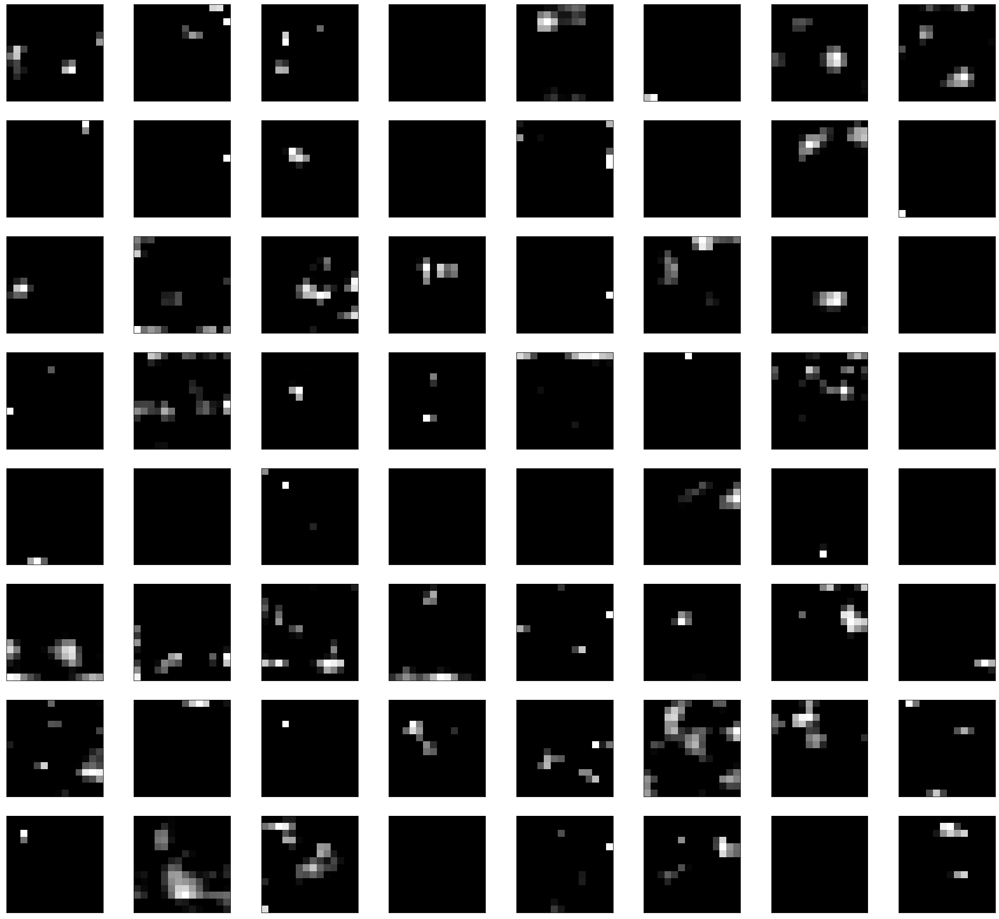

In [26]:
# load the model
model = VGG16()
# redefine model to output right after the first hidden layer
ixs = [2, 5, 9, 13, 17]
outputs = [model.layers[i].output for i in ixs]
model = Model(inputs=model.inputs, outputs=outputs)
# load the image with the required shape
img = load_img('seurat.jpg', target_size=(224, 224))
# convert the image to an array
img = img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = model.predict(img)
# plot the output from each block
square = 8

for fmap in feature_maps:
    figure(figsize=(30, 28), dpi=80)
    ix = 1
    for _ in range(square):
        for _ in range(square):
            # specify subplot and turn of axis
            ax = pyplot.subplot(square, square, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            pyplot.imshow(fmap[0, :, :, ix-1], cmap='gray')
            ix += 1
    # show the figure
    pyplot.show()

> We can see that the feature maps in deeper layers (closer to the inpu)t of the model capture a lot of fine detail in the image and that as we progress deeper into the model, the feature maps show less and less detail.

> You can observe that as the image progresses through the layers then the details from the images slowly disappear. They look like noise, but surely there is a pattern in those feature maps which human eyes cannot detect, but a neural network can.

> By the time the image reaches the last convolutional layer (layer 17), then it is impossible for a human being to tell that there is characters in there. These last layer outputs are really important for the fully connected neurons which basically form the classification layers in a convolutional neural network.

## Visualize heatmaps

In [1]:
%pylab inline
import os
import numpy as np
import pandas as pd
from scipy.misc import imread
from sklearn.metrics import accuracy_score

import keras
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, Activation, Input
from keras.layers import Conv2D, MaxPooling2D

# To stop potential randomness
seed = 128
rng = np.random.RandomState(seed)

data_dir = "../../datasets/MNIST"

train = pd.read_csv('../../datasets/MNIST/train.csv')
test = pd.read_csv('../../datasets/MNIST/Test_fCbTej3.csv')

img_name = rng.choice(train.filename)
filepath = os.path.join(data_dir, 'train', img_name)

img = imread(filepath, flatten=True)

pylab.imshow(img, cmap='gray')
pylab.axis('off')
pylab.show()

temp = []
for img_name in train['filename']:
    image_path = os.path.join(data_dir, 'train', img_name)
    img = imread(image_path, flatten=True)
    img = img.astype('float32')
    temp.append(img)
    
train_x = np.stack(temp)

train_x /= 255.0
train_x = train_x.reshape(-1, 28, 28, 1).astype('float32')

temp = []
for img_name in test['filename']:
    image_path = os.path.join(data_dir, 'test', img_name)
    img = imread(image_path, flatten=True)
    img = img.astype('float32')
    temp.append(img)
    
test_x = np.stack(temp)

test_x /= 255.0
test_x = test_x.reshape(-1, 28, 28, 1).astype('float32')

train_y = keras.utils.np_utils.to_categorical(train.label.values)

split_size = int(train_x.shape[0]*0.7)

train_x, val_x = train_x[:split_size], train_x[split_size:]
train_y, val_y = train_y[:split_size], train_y[split_size:]

# define vars

epochs = 5
batch_size = 128

# import keras modules

from keras.models import Sequential
from keras.layers import Dense

# create model
model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=(28,28, 1)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(10, activation='softmax', name='preds'))


# compile the model with necessary attributes
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

trained_model = model.fit(train_x, train_y, nb_epoch=epochs, batch_size=batch_size, validation_data=(val_x, val_y))

pred = model.predict_classes(test_x)

img_name = rng.choice(test.filename)
filepath = os.path.join(data_dir, 'test', img_name)

img = imread(filepath, flatten=True)

test_index = int(img_name.split('.')[0]) - train.shape[0]

print ("Prediction is: ", pred[test_index])

pylab.imshow(img, cmap='gray')
pylab.axis('off')
pylab.show()

In [27]:
from vis.visualization import visualize_activation
from vis.utils import utils
from keras import activations

from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (18, 6)

# Utility to search for layer index by name.
# Alternatively we can specify this as -1 since it corresponds to the last layer.
layer_idx = utils.find_layer_idx(model, 'preds')

# Swap softmax with linear
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

# This is the output node we want to maximize.
filter_idx = 0
img = visualize_activation(model, layer_idx, filter_indices=filter_idx)
plt.imshow(img[..., 0])

ModuleNotFoundError: No module named 'vis'